# Red & White Wine Data analysis

## *Author: Arjun Vijay Anup*

Datasets used for this project:

    -   `winequality-red.csv`: contains information about the red wines.
    
    -   `winequality-white.csv`: contains information about the white wines
    
    A full description of the values stored in the two *.csv files can be found in the text file “wines.txt”.

In [19]:
# Load in necessary packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.metrics import calinski_harabasz_score
from pandas import DataFrame, Series

#### Loading the winequality-red.csv dataset into Python as a pandas DataFrame.

In [20]:
# Loading `winequality-red.csv` dataset as dataframe
red_wine=pd.read_csv('winequality-red.csv', sep=";")
type(red_wine)

pandas.core.frame.DataFrame

#### Inspecting the data. How many wines are included in this dataset? How many different indicators are included? Does this dataset contain any missing values?

In [21]:
# Printing the first 5 values to inspect the dataset
print(red_wine.head())

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0.56   
1                 25.0                  67.0   0.9968  3.20       0.68   
2                 15.0                  54.0   0.9970  3.26       0.65   
3                 17.0                  60.0   0.9980  3.16       0.58   
4                 11.0                  34.0   0.9978  3.51       0.56   

   alcohol  quality  
0      9.4        5  
1      9.8        5  
2      9.8        5 

* The dataset `red_wine` contains input parameters (*fixed acidity, volatile acidity, citric acid etc.*) with an output variable *Quality* for a given number of red wines.

In [22]:
# Printing row count using len() to check number of red wine measurements included in the dataset
print(f"The dataset contains {len(red_wine)} red wine measurements")

The dataset contains 1599 red wine measurements


In [23]:
# Extracting indicator names from the dataset
red_wine_indctrs = red_wine.columns

# Printing the indicators (column header names)
for col in red_wine_indctrs:
    print(col)
print(f"\nThe dataset contains {len(red_wine_indctrs)} different indicators")

fixed acidity
volatile acidity
citric acid
residual sugar
chlorides
free sulfur dioxide
total sulfur dioxide
density
pH
sulphates
alcohol
quality

The dataset contains 12 different indicators


* Indicators (column headers) included in the dataset are shown above.

In [24]:
# Printing the number of missing values in the `red_wine` dataset
print(red_wine.isna().sum())

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64


* There are no missing values present for any of the indicators in the dataset.

##### Performing an exploratory data analysis, creating both numerical and graphical summaries of the data.

In [25]:
# Numerical summary
red_wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


##### Observations:

* Most of the indicators have low means and standard deviation, showing that most of the distributions are quite compact (Narrow spread). eg: `alcohol` has a mean of $10.422$ and standard deviation of $1.065$. Similarly `pH` has a mean of $2.74$ and standard deviation of $0.15$ 

* Some of the indicators, namely `total sulfur dioxide` (mean=$15.87$, std=$10.46$) and `free sulfur dioxide` (mean=$46.46, std=$32.89$) exhibit much greater variability. This shows that environmental phenomena or the winemaking procedure can cause significant differences across different wines.

* Indicators having a a large difference in between third quartile (75%) and maximum value (max) denotes to large outliers. For eg: `residual sugar`, `free sulfur dioxide`, `total sulfur dioxide` show large differences between the 75% and max values which can shows that it can have large outliers in the data.

* Here, quality is discrete data with fixed values ranging from 3-8 (whole-number values)

* A boxplot for all indicators are made to provide a graphical summary and investigate skewness and potential outliers

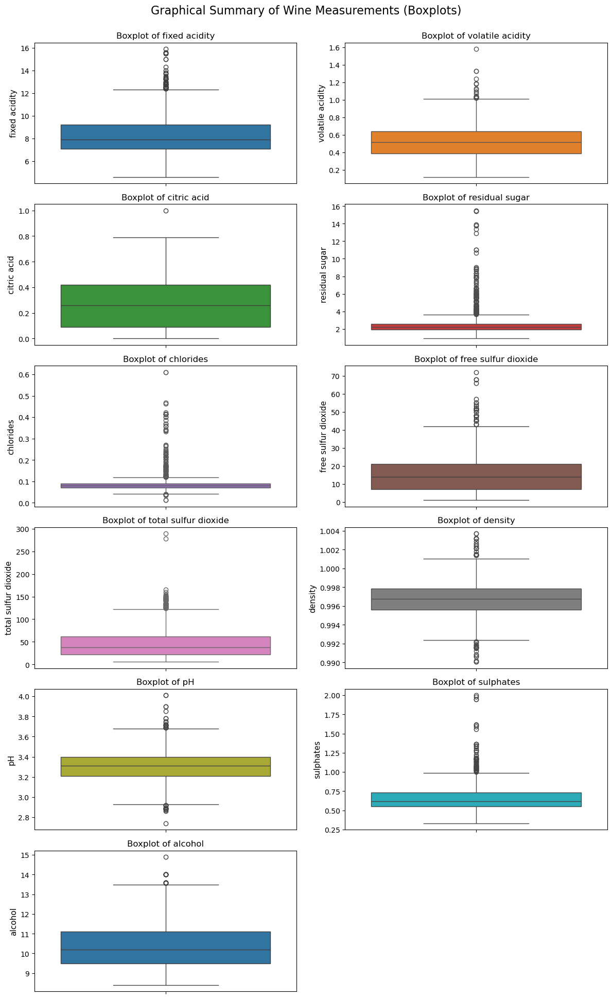

In [26]:
# Initialising overall plot size, colors, variables and the labels that is used in x and y axes
plt.figure(figsize=(12,35))
indctrs = red_wine.columns[:-1].tolist()
colors = sns.color_palette(n_colors=11)

# For loop to iterate through each variable and plot boxplot for each.
for i, (indctr, color) in enumerate(zip(indctrs, colors)):
    # Plotting each boxplot
    plt.subplot(len(indctrs), 2, i+1)
    sns.boxplot(data=red_wine, y=indctr, color=color)
    # Labels and title of the plot
    plt.title(f'Boxplot of {indctr}')
    plt.ylabel(indctr, size=11)

# Adding common main title and making the layout compact
plt.suptitle('Graphical Summary of Wine Measurements (Boxplots)',y=1,size=16)
plt.tight_layout()
plt.show()

**Observations**:

*   Fixed Acidity:

    *   Most of the values centred around 7 to 9

    *   Significant number of outliers are present above 12, denoting the presence of wines which have very high fixed acidity.

*   Volatile Acidity:

    *   Most values centered around 0.4 to 0.6

    *   Significant number of outliers can be seen above 1.0, denoting high variability within the parameter

*   Citric Acid:

    *   Most Values centered around 0.1 to 0.4

    *   Only a single outlier present above the threshold, showing that the variable values are pretty stable across the dataset.

*   Residual Sugar:

    *   Central values present at around 2

    *   Large number of outlier above the threshold value of 4, Indicating high variability in the data and a high number of red wines are sweeter than the average.

*   Chlorides:

    *   Central values present at around 0.1 with high number of significant outliers above the threshold. 

*   Free Sulfur Dioxide:

    *   Values present in the range of 0 and 40, with central values seen at around 10-20. 
    
    *   Significant number of outliers can been seen above threshold of 40. 

*   Total Sulfur Dioxide:

    *   Central values present at around 25-60, with outliers extending beyond 200. This denotes large number of wines having unusually high sulfur content.

*   Density:    

    *   Values are equally distributed with central values present around 0.996 to 0.998.

    *   Minimal outliers present above and below thresholds, indicating uniform density for red wines in the data.

*   pH:

    *   Values centered around 3 to 3.6, with most of the values present between 3.2 and 3.4

    *   Presence of minimal outliers above threshold value of 3.6 and below minimum threshold value of 2.9. This denotes the presence of stable acidity levels across the data.

*   Sulphates:

    *   Central values lie between 0.5 and 0.75, with high number of significant outlier above threshold values of 1.0

*   Alcohol:

    *   Most values lie between 9.5 and 11, with few outlier above 13, representing red wines with unusually high alcohol content


* A seperate countplot was created for `quality` as it is discrete data

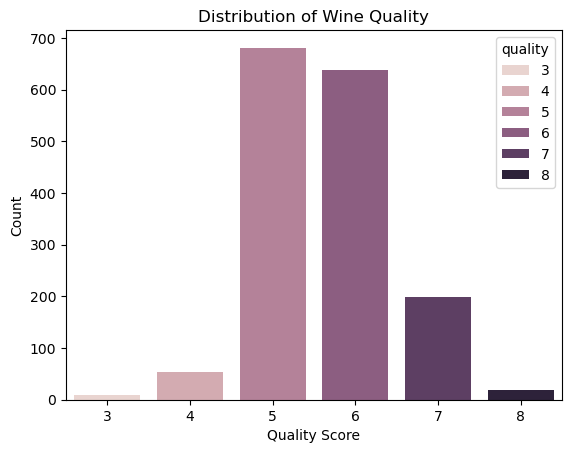

In [27]:
# Distribution of wine quality
sns.countplot(x='quality', data=red_wine, hue='quality')
plt.title("Distribution of Wine Quality")
plt.xlabel("Quality Score")
plt.ylabel("Count")
plt.show()

##### Observations:

-   Most of the wines have quality scores in the mid range (5-6). This denotes that the dataset primarly represents average-quality wines.
-   Wines with scores 3, 4, 7, 8 are less frequent, with extreme scores the least frequent (i.e 3, 8)

#### Loading the winequality-white.csv dataset into Python as a pandas DataFrame.

In [28]:
# Loading `winequality-white.csv` dataset
white_wine=pd.read_csv('winequality-white.csv', sep=";")
type(white_wine)

pandas.core.frame.DataFrame

#### Inspecting the data. How many wines are included in this dataset? Are the indicators the same as those in the red wine group?

In [29]:
# Printing the first 5 values to inspect the dataset
print(white_wine.head())

   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.0              0.27         0.36            20.7      0.045   
1            6.3              0.30         0.34             1.6      0.049   
2            8.1              0.28         0.40             6.9      0.050   
3            7.2              0.23         0.32             8.5      0.058   
4            7.2              0.23         0.32             8.5      0.058   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 45.0                 170.0   1.0010  3.00       0.45   
1                 14.0                 132.0   0.9940  3.30       0.49   
2                 30.0                  97.0   0.9951  3.26       0.44   
3                 47.0                 186.0   0.9956  3.19       0.40   
4                 47.0                 186.0   0.9956  3.19       0.40   

   alcohol  quality  
0      8.8        6  
1      9.5        6  
2     10.1        6 

* The dataset `white_wine` contains input parameters (*fixed acidity, volatile acidity, citric acid etc.*) with an output variable *Quality* for a given number of white wines.

In [30]:
# Printing row count using len() to check number of white wine measurements included in the dataset
print(f"The dataset contains {len(white_wine)} white wine measurements")

The dataset contains 4898 white wine measurements


In [31]:
# Extracting indicator names from the dataset
white_wine_indctrs = white_wine.columns

# Printing the indicators (column header names)
for col in white_wine_indctrs:
    print(col)
print(f"\nThe dataset contains {len(white_wine_indctrs)} different indicators")

fixed acidity
volatile acidity
citric acid
residual sugar
chlorides
free sulfur dioxide
total sulfur dioxide
density
pH
sulphates
alcohol
quality

The dataset contains 12 different indicators


* Indicators included in the dataset are shown above.

In [32]:
# Checking if red wine and white wine indicators are the same
if set(red_wine_indctrs) == set(white_wine_indctrs):
    print("Indicators in white wine group are the same as those in red wine group!")
else:
    print("Indicators in white wine group and red wine group are not the same!")

Indicators in white wine group are the same as those in red wine group!


* As seen above, indicators in the red and white wine group are the same.

#### Performing a t-test, for each of the measurements, to test whether any of the indicators differ between the red and the white groups. Using a significance level of α= 0.01.


*   Before performing the t-test, we state the hypotheses:

    *   Null Hypothesis ($H_0$): $\mu_{red} = \mu_{white}$ ; There is no significant difference between means of red and white wine groups for each indicator
    
    *   Null Hypothesis ($H_a$): $\mu_{red} \neq \mu_{white}$ ; There is significant difference between means of red and white wine groups for each indicator

In [33]:
# List for storing results
ttests=[]

# Loop for going through each measurement
for i in red_wine.columns:
    # Perform the t-test and store t-score and p-value
    t_score = stats.ttest_ind(red_wine[i], white_wine[i]).statistic
    p_val = stats.ttest_ind(red_wine[i], white_wine[i]).pvalue

    # For significance level 0.01, if p-value less than 0.01 null hypothesis is rejected else failed to reject
    if(p_val<=0.01):
        conclusion="Reject null hypothesis"
    else:
        conclusion="Failed to reject null hypothesis"
    
    # Append result to list
    ttests.append((i, t_score, p_val, conclusion))

# Display results in Dataframe with Measurement name, t-score, p-value and Conclusion
ttests_df=pd.DataFrame(ttests, columns=['Measurement', 't-score', 'p-value', 'Conclusion'])
print(ttests_df)

             Measurement    t-score        p-value              Conclusion
0          fixed acidity  44.905568   0.000000e+00  Reject null hypothesis
1       volatile acidity  69.493288   0.000000e+00  Reject null hypothesis
2            citric acid -15.374954   2.003736e-52  Reject null hypothesis
3         residual sugar -29.996105  2.959354e-185  Reject null hypothesis
4              chlorides  48.123066   0.000000e+00  Reject null hypothesis
5    free sulfur dioxide -43.106106   0.000000e+00  Reject null hypothesis
6   total sulfur dioxide -79.074620   0.000000e+00  Reject null hypothesis
7                density  34.200223  7.319605e-236  Reject null hypothesis
8                     pH  28.090026  5.923308e-164  Reject null hypothesis
9              sulphates  44.963402   0.000000e+00  Reject null hypothesis
10               alcohol  -2.658513   7.867874e-03  Reject null hypothesis
11               quality  -9.685650   4.888069e-22  Reject null hypothesis


*   As seen above, p-values of all the indicators are less than the significance level ($\alpha=0.01$). Therefore, there is sufficient evidence to conclude that all measurements show significant differences between the means of red and white wine groups.

*  We reject the null hypothesis ($H_0$) in favour of the alternative hypothesis ($H_a$)

##### (d) Compare the two data sets using appropriate graphical means.

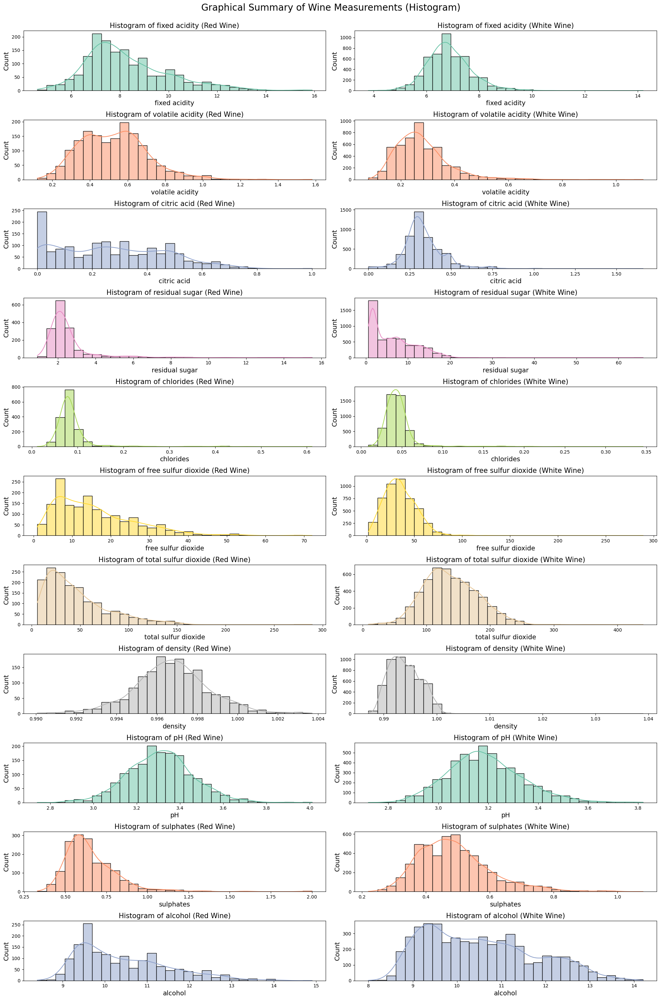

In [34]:
# Initialising overall plot size, colors, variables that is used in x and y axes
plt.figure(figsize=(20,30))
indctrs = red_wine.columns[:-1].tolist()
colors = sns.color_palette("Set2",n_colors=11)

# For loop to iterate through each variable and plot boxplot for each.
for i, (indctr, color) in enumerate(zip(indctrs, colors)):
    # Plotting each boxplot
    plt.subplot(len(indctrs), 2, 2*i+1)
    sns.histplot(data=red_wine, x=indctr, bins=30, color=color, edgecolor='black', kde=True)
    # Label
    plt.title(f'Histogram of {indctr} (Red Wine)', size=15)
    plt.xlabel(indctr,size=14)
    plt.ylabel("Count",size=14)

    # Plotting each boxplot
    plt.subplot(len(indctrs), 2, 2*i+2)
    sns.histplot(data=white_wine, x=indctr, bins=30, color=color, edgecolor='black', kde=True)
    # Label
    plt.title(f'Histogram of {indctr} (White Wine)', size=15)
    plt.xlabel(indctr,size=14)
    plt.ylabel("Count",size=14)

# Adding common main title and making the layout compact
plt.suptitle('Graphical Summary of Wine Measurements (Histogram)',y=1,size=20)
plt.tight_layout()
plt.show()

##### Observations:

*   **Fixed Acidity**

    *   **Red Wine**: Distribution is slightly right skewed, with most values around 8.

    *   **White Wine**: Symmetrical compared to red wine, with most values around 6.5.
    
    *   Therefore according to the data, white wines have lower fixed acidity on average than red wines.

*   **Volatile Acidity**

    *   **Red Wine**: Distribution is skewed and shows a peak at around 0.6.

    *   **White Wine**: A much more symmetrical distribution compared to red wine, with most values around 0.3.
    
    *   White wines have lower volatile acidity on average than red wines.

*   **Citric Acid**

    *   **Red Wine**: Distribution is right skewed with peak at around 0.

    *   **White Wine**: Distribution is much more symmetrical compared to red wine, with most values around 0.3.
    
    *   White wines have a higher citric acid content on average than red wines.

*   **Residual Sugar**

    *   **Red Wine**: Slightly right skewed distribution and shows a peak at around 2.

    *   **White Wine**: Highly right-skewed distribution compared to red wine, with most values around 5.
    
    *   White wines have higher residual sugar and are sweeter on average than red wines.

*   **Chlorides**

    *   **Red Wine**: Right skewed distribution with a narrow peak at around 0.06.

    *   **White Wine**: Right skewed distribution with a narrow peak at around 0.04.
    
    *   Both wines have similar chloride content, but red wines have show slightly higher amounts.

*   **Free Sulfur Dioxide**

    *   **Red Wine**: Highly right skewed distribution with a peak at around 8

    *   **White Wine**: Moderately right skewed distribution with a peak at around 40
    
    *   White wines have higher free sulfur dioxide on average than red wines.

*   **Total Sulfur Dioxide**

    *   **Red Wine**: Highly right skewed distribution with a peak at around 60

    *   **White Wine**: Peaks at around 120 and the distribution is more symmetrical than red wine and more spread out
    
    *   White wines have higher total sulfur dioxide on average than red wines.

*   **Density**

    *   **Red Wine**: Distribution is symmetric and spread out, with peak at around 0.996

    *   **White Wine**: Distribution has a narrow peak at around 0.994
    
    *   Both wines have very similar densities on average

*   **pH**

    *   **Red Wine**: Distribution is symmetric and spread out, with peak at around 3.3

    *   **White Wine**: Symmetric distribution, peaking around 3.2
    
    *   Both wines have very similar pH values, but white wines are ever so slightly more acidic than red wines on average

*   **Sulphates**

    *   **Red Wine**: Distribution is slightly right skewed, with peak at around 0.65

    *   **White Wine**: Distribution is slightly right skewed with larger spread, peaking around 0.5
    
    *   White wines have less sulphate content than red wines on average

*   **Alcohol**

    *   **Red Wine**: Peak at around 9.6%, with long right tail indicating wines fewer wines with higher alcohol content

    *   **White Wine**: Peak at around 10%, with a wider spread in distribution indicating more number of wines with higher alcohol content
    
    *   White wines have slightly higher alcohol content than red wines on average

*   **Quality**

    *   As quality is discrete data, a seperate count plot is created for the quality indicator below.

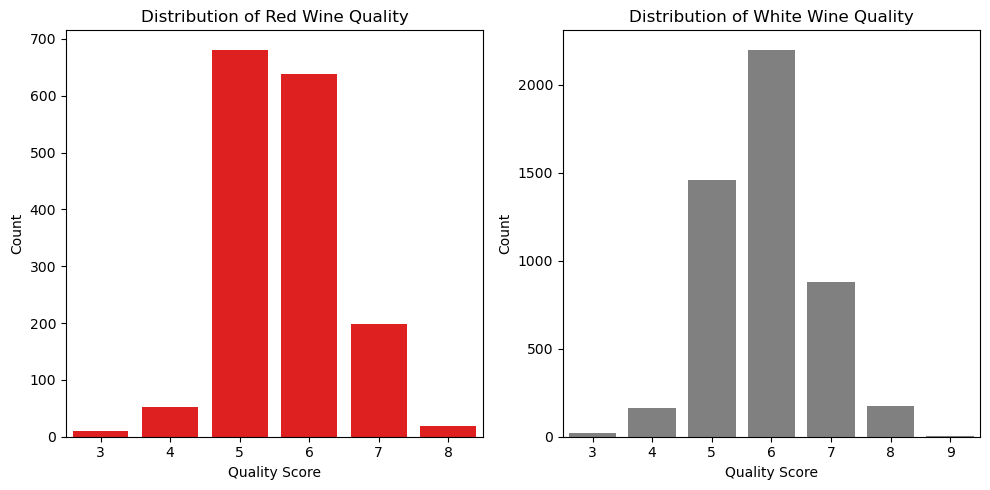

In [35]:
# Distribution of red wine quality
plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
sns.countplot(x='quality', data=red_wine, color='red')
plt.title("Distribution of Red Wine Quality")
plt.xlabel("Quality Score")
plt.ylabel("Count")

# Distribution of white wine quality
plt.subplot(1, 2, 2)
sns.countplot(x='quality', data=white_wine, color="grey")
plt.title("Distribution of White Wine Quality")
plt.xlabel("Quality Score")
plt.ylabel("Count")

# Make layout compact and show plot
plt.tight_layout()
plt.show()

*   **Quality**

    *   **Red Wine**: Most number of wines have a quality of 5, followed by 6 as the second most frequent score

    *   **White Wine**: Most of the wines have a quality of 6, with 5 being the second most common score.
    
    *   Therefore, White wines tend to have slightly higher quality score than red wines on average.

#### Combining the two datasets into a single DataFrame.

In [36]:
# Combining datasets using concat()
combined_wine = pd.concat([red_wine, white_wine]).reset_index(drop=True)

# Printing number of wine measurement to confirm datasets have been combined properly
print(f"The dataset contains {len(combined_wine)} wine measurements")

The dataset contains 6497 wine measurements


#### Computing the Pearson correlation coefficient between each of the measurements and identify which indicators are most correlated. Listing the four most strongly correlated pairs.

In [37]:
p_correlations=[]
combinations = set()

# Calculating Pearson correlation coefficient for each unique pair of measurements
for i in combined_wine.columns:
    for j in combined_wine.columns:
        # if condition check to avoid calculating correlation coefficient between same indicators and allow each unique pair to be calculated only once
        if i!=j and (j,i) not in combinations:
            r = stats.pearsonr(combined_wine[i],combined_wine[j]).statistic
            p_correlations.append((i, j, r))
            combinations.add((i,j))

# Creating a dataframe for the Measurements and correlation coefficient and sorting by the absolute value of the correlation coefficient in descending order
p_correlations_df=pd.DataFrame(p_correlations, 
                               columns=['Measurement1', 'Measurement2', 'Pearson Correlation Coefficient']).sort_values(by='Pearson Correlation Coefficient', 
                                                                                                                        key=np.abs, ascending=False)

# Extracting for the four most strongly correlated pairs
top4_p_correlations_df=p_correlations_df[:4]

# Printing four most strongly correlated pairs
print(top4_p_correlations_df)

           Measurement1          Measurement2  Pearson Correlation Coefficient
45  free sulfur dioxide  total sulfur dioxide                         0.720934
58              density               alcohol                        -0.686745
33       residual sugar               density                         0.552517
32       residual sugar  total sulfur dioxide                         0.495482


*   The above measurement combinations are the four most strongly correlated pairs based on thier absolute pearson corellation coefficient values.

#### Creating scatter plots for the each of the correlated pairs identified. Checking if the relationships are as expected from the correlation coefficients.

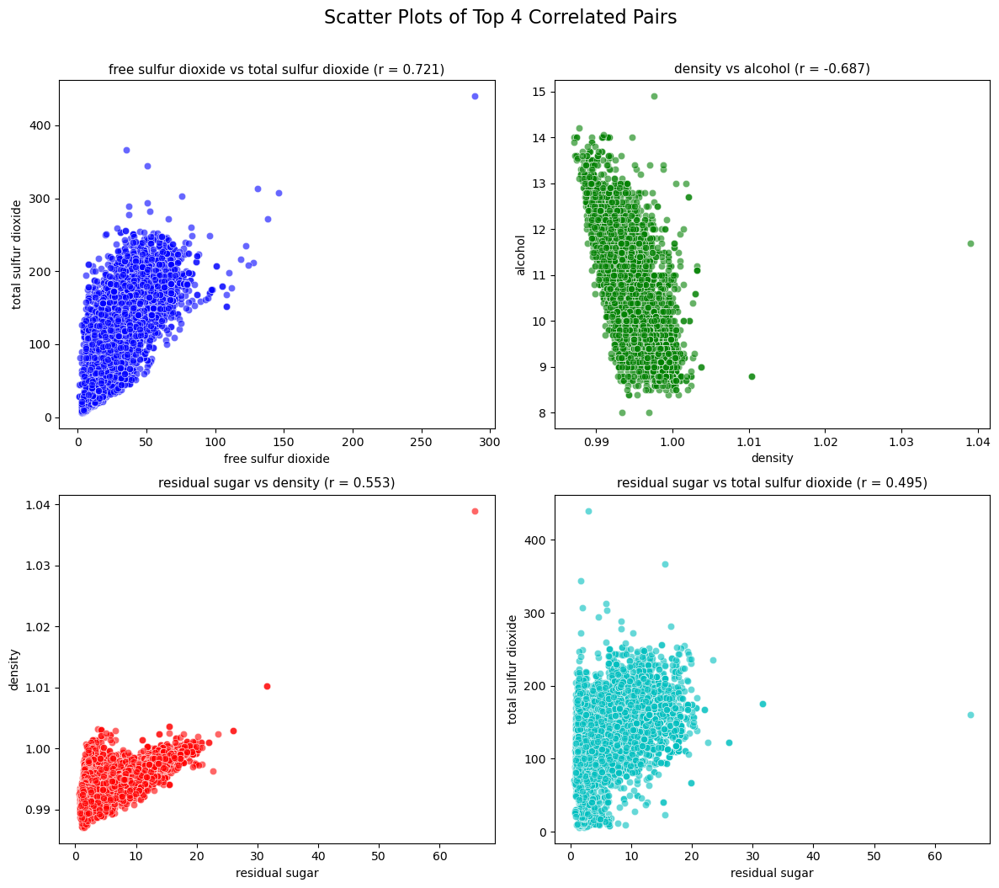

In [38]:
# Initialising overall plot size, colors, variables that is used in x and y axes
plt.figure(figsize=(12, 10))
colors = ['b', 'g', 'r', 'c']

# for loop to iterate through each row using .iloc[] and plot scatterplot for each of the top 4 most strongly correlated indicator combinations.
for i in range(len(top4_p_correlations_df)):
    row = top4_p_correlations_df.iloc[i]
    # Creating subplots
    plt.subplot(2, 2, i + 1)
    # Plotting scatterplot for each strongly correlated pairs
    sns.scatterplot(data=combined_wine, x=row['Measurement1'], y=row['Measurement2'], alpha=0.6, color=colors[i])
    # Adding title for each subplot with correlation coefficient
    plt.title(f"{row['Measurement1']} vs {row['Measurement2']} (r = {row['Pearson Correlation Coefficient']:.3f})", size=11)

# Adding common main title and making the layout compact and display the plot
plt.tight_layout()
plt.suptitle('Scatter Plots of Top 4 Correlated Pairs', y=1.05, size=16)
plt.show()

**Observations**

*   Observing the Person correlation coefficient values for the four most strongly correlated pairs earlier in 3(b) and the scatterplot for these indicator combinations:

    *   `free sulfur dioxide` vs `total sulfur dioxide` 

        *   The scatterplot shows points that are tightly packed with an upward-sloping linear pattern.
        *   This relationship is as expected from the correlation coefficients, which show a high $r$ value of $0.721$.

    *   `residual sugar` vs `density`
        
        *   The scatterplot shows a moderate tight cluster of points with an upward-sloping linear trend.
        *   This relationship is as expected from the correlation coefficients, which show a moderately high $r$ value of $0.533$.

    *   `residual sugar` vs `total sulfur dioxide`
        
        *   The scatterplot shows points that are moderately clustured, following an upward-sloping linear pattern 
        *   This relationship is as expected from the correlation coefficients, which show a moderately high $r$ value of $0.495$

    *   `density` vs `alcohol`
        
        *   The scatterplot shows points that are tightly packed forming a downward-sloping linear trend 
        *   This relationship is as expected from the correlation coefficients, which show a strong negative corellation $r$ value of $-0.687$


The full dataset should be used for all subsequent questions.

#### Performing Linear regression to predict wine quality.

*(Wine quality scores used as dependent variable)*

#### We consider wine with a quality score from 0 to 5 as being POOR, while quality scores from 6-10 are considered GOOD and we create a new column in the dataframe indicating whether the wine is POOR or GOOD.

In [39]:
# Adding new column `Quality Category` to the combined_wine dataset
combined_wine['Quality Category'] = np.where(combined_wine['quality']>5, 'GOOD', 'BAD')

# Printing column names to check new column addition
print(combined_wine.columns)

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'Quality Category'],
      dtype='object')


*   New column `Quality Category` added to the combined dataset which categorizes wines which have quality 6-10 as **GOOD** and 0-5 as **BAD**

#### Separating the data into response and predictor variables and standardising the predictor variables.

In [40]:
# Extracting predictors into x (All columns except quality and Quality Category)
x = combined_wine.drop(['quality', 'Quality Category'], axis=1)

# Extracting response variable y (quality)
y = combined_wine['quality']

# Standardising the predictor variables
x_std=((x-x.mean())/x.std())

# Adding intercept column to predictors as the first column.
x_std.insert(0,'intercept',1)

# Printing first 5 values of standardised predictor variables 
print(x_std.head())

   intercept  fixed acidity  volatile acidity  citric acid  residual sugar  \
0          1       0.142462          2.188664    -2.192664       -0.744721   
1          1       0.451001          3.281982    -2.192664       -0.597594   
2          1       0.451001          2.553104    -1.917405       -0.660648   
3          1       3.073580         -0.362411     1.660957       -0.744721   
4          1       0.142462          2.188664    -2.192664       -0.744721   

   chlorides  free sulfur dioxide  total sulfur dioxide   density        pH  \
0   0.569914            -1.100055             -1.446247  1.034913  1.812950   
1   1.197883            -0.311296             -0.862402  0.701432 -0.115064   
2   1.026618            -0.874695             -1.092402  0.768128  0.258100   
3   0.541370            -0.762016             -0.986248  1.101609 -0.363840   
4   0.569914            -1.100055             -1.446247  1.034913  1.812950   

   sulphates   alcohol  
0   0.193082 -0.915394  
1   0.

#### Fitting a linear regression model and interpreting the fitted model.

In [41]:
# Fitting linear regression model for the standardized predictors and response variable
mod = sm.OLS(y, x_std).fit()

# Display statistical summary of the fitted model
print(mod.summary())

                            OLS Regression Results                            
Dep. Variable:                quality   R-squared:                       0.292
Model:                            OLS   Adj. R-squared:                  0.291
Method:                 Least Squares   F-statistic:                     243.3
Date:                Wed, 25 Jun 2025   Prob (F-statistic):               0.00
Time:                        00:49:30   Log-Likelihood:                -7215.5
No. Observations:                6497   AIC:                         1.445e+04
Df Residuals:                    6485   BIC:                         1.454e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
intercept                5.8184 

*   **Observations**

    *   Model has an $R^2$ value of $0.292$, which shows that the model is responsible for 29.2% of variability in wine quality

    *   Model also has AIC and BIC Scores of $1.445\times10^4$

    *   The F-statistic has a significantly high value with overall $p <0.001$, which shows that the predictors present in the model as a whole are significant.

    *   `citric acid` and `chlorides` have $p$-values $0.168$ and $0.146$ respectively, showing that they are insignificant predictors in the model.

    *   `fixed acidity`, `residual sugar`, `free sulfur dioxide`, `pH`, `sulphates` and `alcohol` have a positive effect on the wine quality (i.e an increase in these predictors leads to an increase in the overall wine quality)
    
    *   `volatile acidity`, `citric acid`, `chloride`, `total sulfur dioxide`, `density` have a negative effect on the wine quality (i.e an increase in these predictors leads to an decrease in the overall wine quality)


#### Performing forward selection for the regression model using Akaike Information Criterion (AIC). Examining the selected model and discuss your findings in relation to the previous model.

In [42]:
def forwardAIC(x_std, y):
    # Starting with intercept
    selected_predictors = ['intercept']
    # Columns to evaluate (Apart from intercept)
    remaining_predictors = [col for col in x_std.columns if col != 'intercept']
    # Starting with AIC with intercept-only model
    current_aic = sm.OLS(y, x_std[selected_predictors]).fit().aic
    best_aic=current_aic
    
    while remaining_predictors:
        # List to store AIC values for remaining columns
        predictor_aics = []
        
        for col in remaining_predictors:
            # Test model with the current column added
            test_predictors = selected_predictors + [col]
            model = sm.OLS(y, x_std[test_predictors]).fit()
            predictor_aics.append((col, model.aic))
        
        # Selecting predictor that minimizes AIC
        best_col, best_new_aic = min(predictor_aics, key=lambda x: x[1])
        
        # Checking if adding this predictor lowers the AIC
        if best_new_aic < best_aic:
            selected_predictors.append(best_col)
            remaining_predictors.remove(best_col)
            best_aic = best_new_aic
        else:
            # Stop if no AIC improvement
            break
    
    # Return the selected column indices
    return selected_predictors

# Fitting the final model with the forward-selected variables
fAIC_predictors=forwardAIC(x_std, y)
forwardAIC_mod=sm.OLS(y, x_std[fAIC_predictors]).fit()

# Display the statistical summary of the fitted model
print(forwardAIC_mod.summary())

                            OLS Regression Results                            
Dep. Variable:                quality   R-squared:                       0.292
Model:                            OLS   Adj. R-squared:                  0.291
Method:                 Least Squares   F-statistic:                     267.4
Date:                Wed, 25 Jun 2025   Prob (F-statistic):               0.00
Time:                        00:49:30   Log-Likelihood:                -7216.4
No. Observations:                6497   AIC:                         1.445e+04
Df Residuals:                    6486   BIC:                         1.453e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
intercept                5.8184 

*   **Comparison**

    *   Initial Model:

        *   Included all 11 predictor variables
        *   AIC = $1.445\times10^4$
        *   $R^2$ = $0.292$

    *   Model selected by Forward Selection:
    
        *   `citric acid` predictor variable removed from the initial model by forward selection process
        *   Contains only 10 predictor variables
        *   AIC = $1.445\times10^4$
        *   $R^2$ = $0.292$

*   **Observations**

    *   The two regression models have nearly the same AIC and $R^2$ values, suggesting that the removal of `citric acid` predictor variable has had minimal to no impact on the overall model fit.

    *   Forward selection process proved that `citric acid`, which had the highest $p$-value of $0.168$ in the initial model, did not contribute significantly in explaining the varaibility of wine quality.

    *   By eliminating an unwanted predictor, the model is made easier to interpret and also can help to avoid overfitting
    
    *   The forward selection process reaffirmed that variables such as `alcohol`, `volatile acidity`, `residual sugar` are the most significant predictors as they remained consistently significant across both models.

The original (without the additional column created for question 4) non-standardised dataset
should be used for all subsequent questions.

#### Random forest regression to predict the quality of a wine.

*(Remaining indicators to be used as predictor variables.)*

#### Splitting the data into appropriate training and test sets.

In [43]:
# Only using remaining predictors after forward AIC, excluding intercept used in new non standardized predictor variable dataset
x=x[list(set(fAIC_predictors)-{'intercept'})]

# Extracting 75% of size of the dataset for splitting to make training and test datasets
train_size=round(len(y)*0.75)

# Setting a seed for reproducibility
np.random.seed(123)

# Shuffling indices for randomness
train_select = np.random.permutation(range(len(y)))

# Splitting the data for training and test datasets of standardized predictor values and response values
x_train=x.iloc[train_select[:train_size],:].reset_index(drop=True)
x_test=x.iloc[train_select[train_size:],:].reset_index(drop=True)
y_train=y[train_select[:train_size]].reset_index(drop=True)
y_test=y[train_select[train_size:]].reset_index(drop=True)

# Displaying size of training and test datasets
print("Size of predictors training dataset:",len(x_train))
print("Size of responses training dataset:",len(y_train))
print("Size of predictors test dataset:",len(x_test))
print("Size of responses test dataset:",len(y_test))
print(x.columns)

Size of predictors training dataset: 4873
Size of responses training dataset: 4873
Size of predictors test dataset: 1624
Size of responses test dataset: 1624
Index(['free sulfur dioxide', 'total sulfur dioxide', 'fixed acidity',
       'sulphates', 'residual sugar', 'alcohol', 'chlorides', 'density',
       'volatile acidity', 'pH'],
      dtype='object')


#### Fitting a random forest regression model with 10 trees using the training data and determining which variables are most important in predicting the quality of a wine.

In [44]:
# Fitting random forest regression model with 10 trees and including argument random_state=101
rf=RandomForestRegressor(n_estimators=10, random_state=101)
rf.fit(x_train, y_train)

# Extracting improtance values of each predictor variable using feature_importances_
rf_sel_predictors_df=pd.DataFrame({'Predictors': x.columns, 'Importance': rf.feature_importances_}).sort_values(by='Importance', ascending=False)
print(rf_sel_predictors_df)

             Predictors  Importance
5               alcohol    0.254415
8      volatile acidity    0.136920
0   free sulfur dioxide    0.093496
1  total sulfur dioxide    0.083092
3             sulphates    0.078324
4        residual sugar    0.078283
9                    pH    0.077871
6             chlorides    0.075674
7               density    0.063326
2         fixed acidity    0.058599


* **Observations**

    *   The random forest regression model identified `alcohol`, `volatile acidity` as the two main predictors in the model, which is consistent with the findings in the linear model obtained from forward selection process in Question 4.

    *   However, predictor variables that had a higher importance in the linear model, such as `residual sugar` and `density`, have a lower importance in the random forest regression model.
    
    *   The random forest regression also assigned higher importances to predictor variables which were ranked lower in the linear model, such as `free sulfur dioxide` and `total sulfur dioxide`. This denotes that the forest regression model can capture linear as well as non-linear relationships which were not seen in the linear model.

#### Using the random forest regression model to predict the quality of a wine for the test set and then creating a scatter plot of the true quality versus the predicted one.

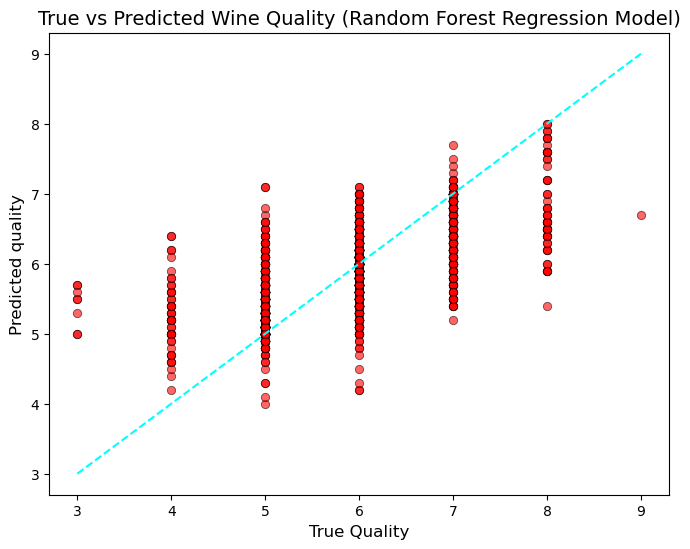

In [45]:
# Predicting wine quality for the test set using the random forest regression model 
rf_test_pred=rf.predict(x_test)

# Setting plot size and Creating scatterplot of true quality vs predicted quality
plt.figure(figsize=(8,6))
plt.scatter(x=y_test, y=rf_test_pred, alpha=0.6, color='red', edgecolors='black', linewidths=0.6)

# Plotting dotted diagonal to representing perfect predictions (True=Predicted)
plt.plot([min(y_test), max(y_test)],[min(y_test), max(y_test)], ls='--',  color='cyan')

# Inserting labels, titles and display the plot
plt.xlabel("True Quality", size=12)
plt.ylabel("Predicted quality", size=12)
plt.title("True vs Predicted Wine Quality (Random Forest Regression Model)", size=14)
plt.show()

* **Observations**

    *   The scatterplot shown above indicates that the random forest regression model performed well in predicting wine quality for certain quality values, but exhibit errors and deviations in predicting wine quality values at the low and high extremes.

    *   The model performs well for wines with average quality scores. Predicted values for average quality scores (`5`, `6` and `7`) cluster around the true quality value diagonal, indicating good prediction accuracy.

    *   The model struggles to predict extreme quality scores. Prediction errors can be seen for extremely high or low quality values (`3`, `4`, `8` and `9`) and the spread increases at these extremes.

#### Assessing the performance of a random forest regression model with 5, 10, 50, 100, 500, 1000, and 5000 trees in predicting the quality of a wine and repeat the model fit and prediction 20 times for each number of trees, using a different random state for each repeat. Then, creating a plot of the model performance as a function of the number of trees (using log axis for the number of trees).

*   Here the performance metric considered is the Mean squared error (MSE)

In [46]:
# Creating list containing number of trees for each model fit and prediction
trees=[5, 10, 50, 100, 500, 1000, 5000]

# Lists to store mean and standard errors of the performance metric (MSE)
means=[]
std_errs=[]

# for loop to iterate through each tree value
for n in trees:
    
    # List to store performance metrics for each of the prediction iteration
    metric_list =[]
    
    # for loop to iterate model training and prediction and caluculate MSE 20 times
    for i in range(20):
        
        # Fitting random forest regression model for n trees and random number for random_state
        # n_jobs=-1 to enable parellel computation (multi-core processing) to save time in running the model
        rf=RandomForestRegressor(n_estimators=n, random_state=np.random.randint(0,100), n_jobs=-1)
        rf.fit(x_train, y_train)
        
        # Predicting wine quality for test set
        rf_test_pred=rf.predict(x_test)
        
        # Calculate MSE
        perf_metric = np.mean((y_test - rf_test_pred) ** 2)
        
        # Add MSE to the performance metric list
        metric_list.append(perf_metric)
    
    # Calculating and storing mean and std. error for the specified tree value
    means.append(np.mean(metric_list))
    std_errs.append(np.std(metric_list))


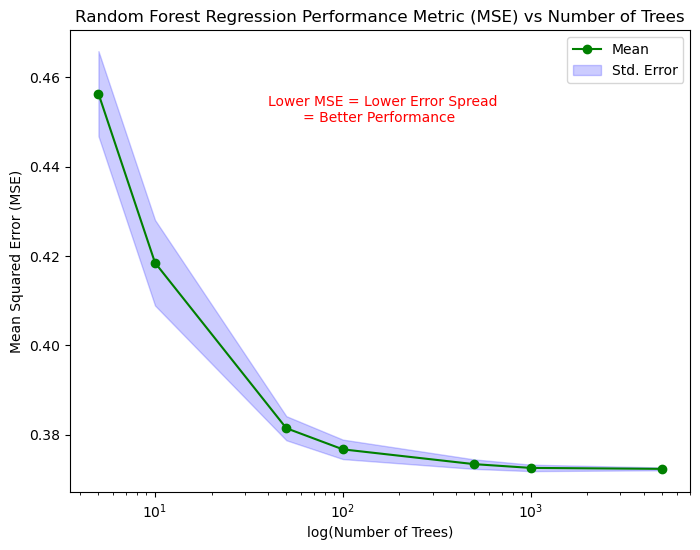

In [47]:
plt.figure(figsize=(8,6))

# Plotting mean of MSE vs tree value
plt.plot(trees, means, marker='o', ls="-", color='green', label='Mean')

# Plotting std. error as a shaded region around the mean 
plt.fill_between(trees, np.array(means) - np.array(std_errs), np.array(means) + np.array(std_errs), 
                 color='blue', alpha=0.2, label='Std. Error')

# Setting x axis to log scale
plt.xscale('log')

# Adding labels, titles, legend and displaying the plot
plt.xlabel('log(Number of Trees)')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('Random Forest Regression Performance Metric (MSE) vs Number of Trees')
plt.text(40, 0.45, 
         'Lower MSE = Lower Error Spread \n        = Better Performance', 
         size=10, color='red')
plt.legend()
plt.show()

*   **Observations**
    
    *   The MSE decreased as the number of trees increases. There is a significant decrease in the MSE from tree value `5` to `100`. This suggests that the forest regression model becomes more accurate and stable with increasing number of trees.

    *   Beyond `100` trees, the decrease in MSE plateaus, leading to no significant improvement in model performance. Increase in the number of trees beyond this point lead to diminishing returns in model performance.

    *   The standard error of MSE decreased with increase in number of trees.

    *   Therefore, the plot shows that even though increasing the number of trees enhances model performance initially, the improvement plateaus after a certain point, suggesting using excessively large number of trees unjustified compared to the additional computational load

##### Rationale for fitting the model multiple times with different random states.


*	Fitting the model multiple times with different random states is crucial as random forest models can vary depending on the random seed used to initialize it.

*	By using different random states, we can ensure that the model does not **overfit** with a particular set of data. This increases the generalization ability of the model.

*	By fitting the model repeatedly with different random states, we get a more accurate understanding of the variability in the model's performance, which help in understanding how stable the model is in different conditions. The mean and standard error which was calculated earlier over multiple runs for different number of estimators (trees) in the model gave a more accurate measure of the model performance. In contrast, single model evaluation could lead to noise and variability, which leads to misinterpretation of the model.

*	If we use a single random state, it might lead to biased results if the random split favors certain aspects of the data. Using multiple states ensures that the model’s performance is not overly influenced by any particular initialization and lead to potentially biased results.



### Clustering algorithms to identify different wine groups

#### Performing a k-means cluster analysis, using the indicators as the features. Running the clustering algorithm for different numbers of clusters (integers from 1 to 10) and then plotting the model performance as a function of the number of clusters and identifying  the optimal number of clusters for this data.

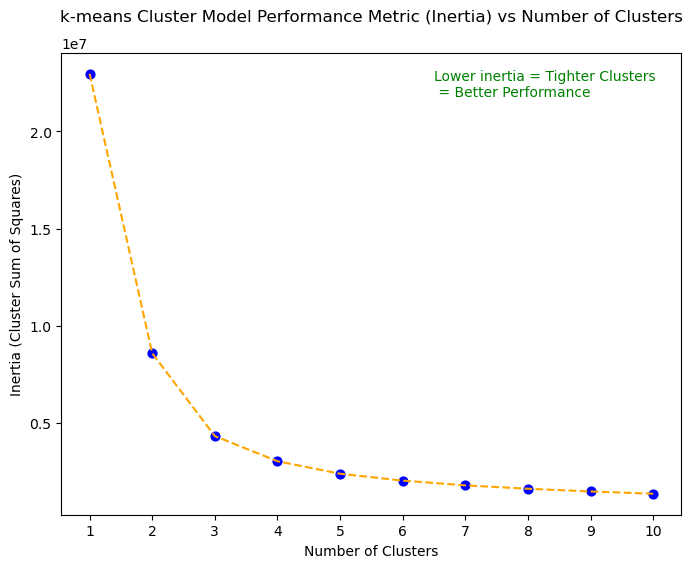

In [48]:
# Extracting non-standardized indicators as the features, excluding the quality category as well as quality (as it is discrete data)
k_means_cluster_data = combined_wine.drop(['Quality Category', 'quality'], axis=1)

# Creating list to store cluster sum of square values (inertia)
cluster_ss=[]

# Loop to iterate through no. of clusters (1 - 10)
for i in range(1,11):

    # k-means clustering with i number of clusters and then fitting the model to the dataset
    cluster_model = KMeans(n_clusters=i, n_init=10)
    cluster_model.fit(k_means_cluster_data)

    # Adding the cluster inertia value to the list
    cluster_ss.append(cluster_model.inertia_)

plt.figure(figsize=(8,6))

# Creating a scatter plot with inertia values for each number of clusters with lines
plt.scatter(range(1,11), cluster_ss, color='blue', s=40)
plt.plot(range(1,11), cluster_ss, ls='--', color='orange')

# Adding plot title, labels, tick values and displaying the plot
plt.title("k-means Cluster Model Performance Metric (Inertia) vs Number of Clusters",y=1.05)
plt.text(6.5, max(cluster_ss) * 0.95, 
         'Lower inertia = Tighter Clusters\n = Better Performance', size=10, color='green')
plt.ylabel("Inertia (Cluster Sum of Squares)")
plt.xticks(range(1,11))
plt.xlabel("Number of Clusters")
plt.show()

*   **Observations**:

    *   The cluster sum of squares (inertia) decreased as the number of clusters increased. There is a rapid decrease in the within-cluster sum-of-squares from `1` to `3`. This clearly depicts that the k-means cluster model performance increased and became more stable as the number of clusters increased.

    *   Beyond `3` clusters, the inertia value experienced minimal decrease with increase in the number of clusters, leading to diminishing returns in the model performance. 

    *   Therefore, we consider the optimal number of clusters = `3`.

#### Performing a k-means cluster analysis, using the optimal number of clusters (identified previously), and identifying the most discriminatory variables.

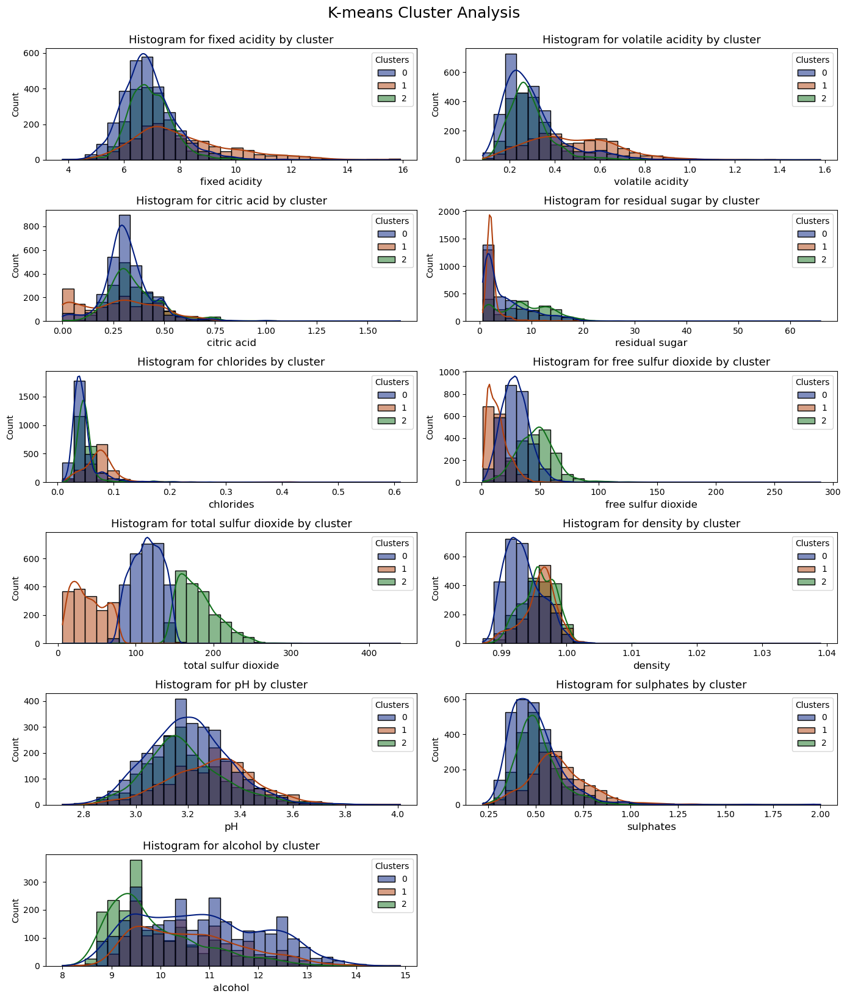

In [49]:
# Considering optimal number of clusters = 3 from part(a)
k_optimal = 3

# k-means clustering model with the chosen number of clusters. Random state value given to ensure reproducibility
final_cluster_model= KMeans(n_clusters=k_optimal, n_init=10, random_state=101)

# Fitting the model with the optimal number of cluster to the dataset
final_cluster_model.fit(k_means_cluster_data)

# Adding a new column to the dataset `Predicted cluster` which contains the predicted cluster values
k_means_cluster_data['Clusters']=final_cluster_model.predict(k_means_cluster_data)

# Setting the plot size
plt.figure(figsize=(14,16))

# for loop to iterate through the dataset columns (except the newly added predicted cluster column)
for i, col in enumerate(k_means_cluster_data.columns[:-1]):
    plt.subplot(6,2,i+1)
    
    # Plotting histograms of the indicator values, colored by the predicted cluster value 
    sns.histplot(data=k_means_cluster_data, x=col, hue='Clusters', palette='dark', kde=True, bins=30)
    
    # Adding title for individual plots, labels
    plt.title(f'Histogram for {col} by cluster', size=13)
    plt.xlabel(f"{col}",size=12)

# Making Layout compact, adding main title and displaying the histogram plot
plt.tight_layout()
plt.suptitle("K-means Cluster Analysis", y=1.02, size=18)
plt.show()

*   **Observations**

    *   In the above histograms of k-means cluster analysis, it can be seen that indicators `total sulfur dioxide` ,`free sulfur dioxide` and `density` *(In decreasing order of seperation magnitude)* have the most seperations between each cluster in thier distributions

    *   Therefore, we select `total sulfur dioxide` ,`free sulfur dioxide` and `density` as the most discriminatory variables
    

#### Creating a series of scatter plots for the most discriminatory variables, colouring the points by cluster number.

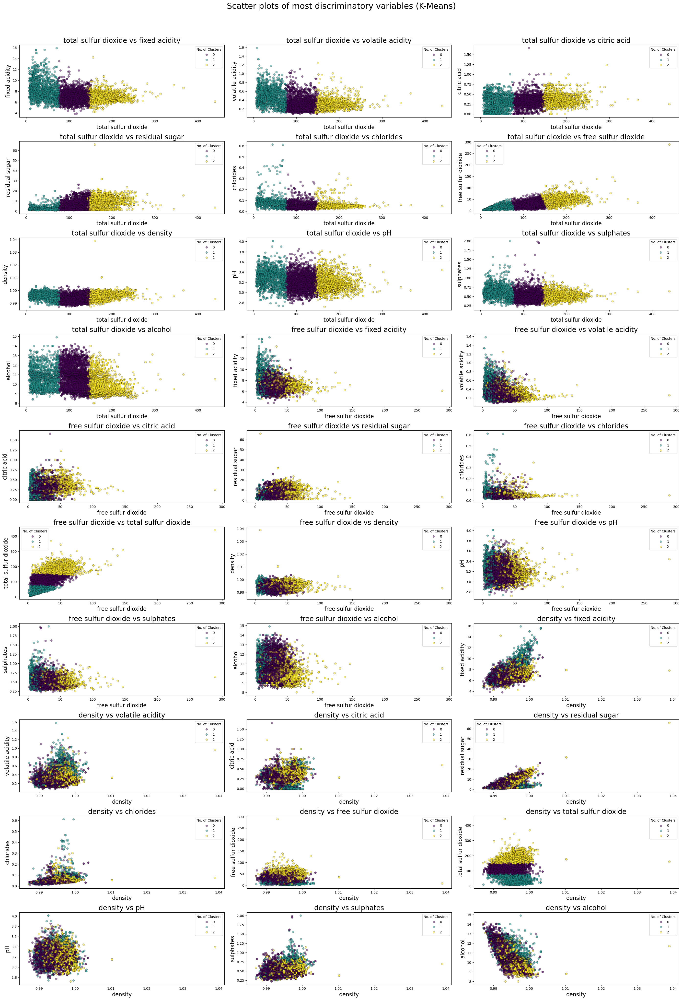

In [50]:
# Creating a list with most discriminatory variables
most_disc_vars=['total sulfur dioxide', 'free sulfur dioxide', 'density']

# Set to store already used variable combinations in plots
combinations=set()

# Set figure size
plt.figure(figsize=(28,40))

# Setting index value for subplotting
index=1

# for loop to iterate through pairs of most discriminatory variables and other variables in the original dataset (Clusters column excluded from the plot)
for i in range(len(most_disc_vars)):
    for j in range(len(k_means_cluster_data.columns[:-1])):

        # Ignore duplicate variable pairs and self-pairing 
        if most_disc_vars[i]!=k_means_cluster_data.columns[j] and (most_disc_vars[i],k_means_cluster_data.columns[j]) not in combinations:
            
            # Creating subplots
            plt.subplot(10,3,index)
            
            # Adding current variable pair to the set to avoid replotting
            combinations.add((most_disc_vars[i],k_means_cluster_data.columns[j]))
            
            # Creating scatterplot for the pair of variables, coloured and grouped by clusters
            sns.scatterplot(data=k_means_cluster_data, x=most_disc_vars[i], y=k_means_cluster_data.columns[j], hue='Clusters', 
                            palette='viridis', alpha=0.5, edgecolor='black')
            
            # Adding individual plot title, labels and legend
            plt.title(f"{most_disc_vars[i]} vs {k_means_cluster_data.columns[j]}",size=20)
            plt.xlabel(f"{most_disc_vars[i]}", size=16)
            plt.ylabel(f"{k_means_cluster_data.columns[j]}", size=16)
            plt.legend(title='No. of Clusters')

            # Increasing index value by 1
            index+=1

# Adding Main title, making plot compact and displaying the plot
plt.suptitle("Scatter plots of most discriminatory variables (K-Means)", size=24, y=1.02)
plt.tight_layout()
plt.show()

*   The scatterplots show the relationship between discriminatory variables and other features present in the dataset after K-means clustering

*   **Cluster scatterplots by `total sulfur dioxide`**

    *   From the variables chosen as discriminatory, only `total sulfur dioxide` effectively seperate the data into 3 groups (clusters).

    *   The clusters are seperated well, with higher `total sulfur dioxide` values forming better well defined clusters than lower values.

    *   Slight overlap is observed at lower `total sulfur dioxide` values, denoting moderate distinction for lower values.

*   **Cluster scatterplots by `density`**

    *   The worst seperation trend appears in scatterplots with `density`, where the relationship with other variables appear weak.

    *   Seperation between clusters is not prominent with higher overlap between clusters in lower `density` values.

*   **Cluster scatterplots by `free sulfur dioxide`**

    *   `free sulfur dioxide` shows moderate cluster seperation with other variables when compared to `total sulfur dioxide` and `density`

    *   Clusters have moderate seperation with slight overlaps for higher values of `free sulfur dioxde. However, lower values have more pronounced overlap between clusters

#### Identifying another clustering algorithm that may be suitable for this data. We then compare the results in relation to those from the k-means cluster analysis.
(See https://scikit-learn.org/stable/modules/clustering.html for an overview of other clustering algorithms.)

*   Performing Spectral Clustering analysis, using the indicators as the features. Running the clustering algorithm for different numbers of clusters (integers from 2 to 20). Plotting the model performance (Calinski Harabasz Score) as a function of the number of clusters and identifying the optimal number of clusters for this data.

*   Spectral clustering is a graph distance (eg. Nearest neighbour graph) based clustering algorithm that groups points based on thier relationship in a similarity graph

*   Spectral clustering might suit our data as most of the variables are co-dependent and exhibit non-linear relationships between them.

*   Also, as it relies on graph partitioning, it can capture intricate non-linear relationships better and therefore, allow for better clustering

*   Spectral clustering works best if:

    *   Dataset is small to medium size (Medium `n_samples`)
    *   Clusters are non linear
    *   Dataset has a high number of variables (High dimensional data) - It reduces dimensionality but preseves the relationship between data points

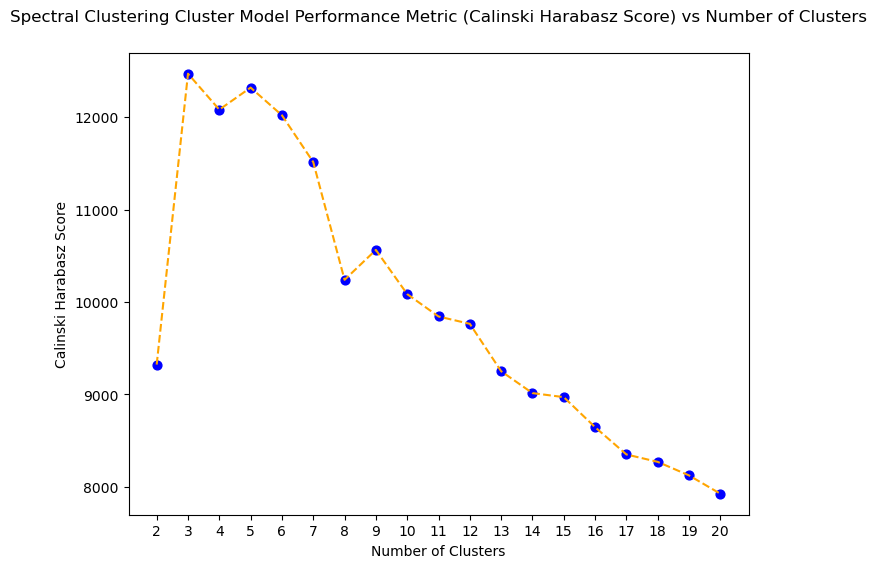

In [51]:
# Extracting non-standardized indicators as the features, excluding the quality category as well as quality (as it is discrete data)
spectral_cluster_data = combined_wine.drop(['Quality Category', 'quality'], axis=1)

# Creating list to store Calinski Harabasz Score
scores=[]

# Loop to iterate through no. of clusters (Spectral clustering requires atleast 2 clusters)
for i in range(2,21):

    # Spectral clustering with i number of clusters and then fitting the model to the dataset using 'discretize' assign_label
    sp_cluster_model = SpectralClustering(n_clusters=i, n_jobs=-1, assign_labels='discretize', random_state=101, affinity='nearest_neighbors')
    pred_cluster=sp_cluster_model.fit_predict(spectral_cluster_data)

    # Adding the cluster score value to the list
    score_val=calinski_harabasz_score(spectral_cluster_data, pred_cluster)
    scores.append(score_val)


plt.figure(figsize=(8,6))

# Creating a scatter plot with Score values for each number of clusters with lines
plt.scatter(range(2,21), scores, color='blue', s=40)
plt.plot(range(2,21), scores, ls='--', color='orange')

# Adding plot title, labels, tick values and displaying the plot
plt.title("Spectral Clustering Cluster Model Performance Metric (Calinski Harabasz Score) vs Number of Clusters",y=1.05)
plt.ylabel("Calinski Harabasz Score")
plt.xticks(range(2,21))
plt.xlabel("Number of Clusters")
plt.show()

*   **Observations**:

    *   **K-means**

        *   There was a rapid decrease in the within-cluster sum-of-squares from `1` to `3`. 

        *   Beyond `3` clusters, the inertia value experienced minimal decrease with increase in the number of clusters, leading to diminishing returns in the model performance. 

        *   Therefore, we consider the optimal number of clusters = `3`.
    
    *   **Spectral Clustering**

        *   There was a rapid increase in the Calinski Harabasz Score (Variance Ratio Criterion) from `2` to `3`. 

        *   After reaching a peak of `3` clusters, a slight decrease in the score was observed at `4` and an increase was achieved in `5`. 
        
        *   The Calinski Harabasz Score value experienced a gradual decrease with increase in the number of clusters from here on up until `20` clusters, leading to decrease in the model performance as number of clusters increased. Therefore, we consider the optimal number of clusters = `3`.


*   Performing a Spectral clustering cluster analysis, using the optimal number of clusters (identified earlier), and identifying the most discriminatory variables.

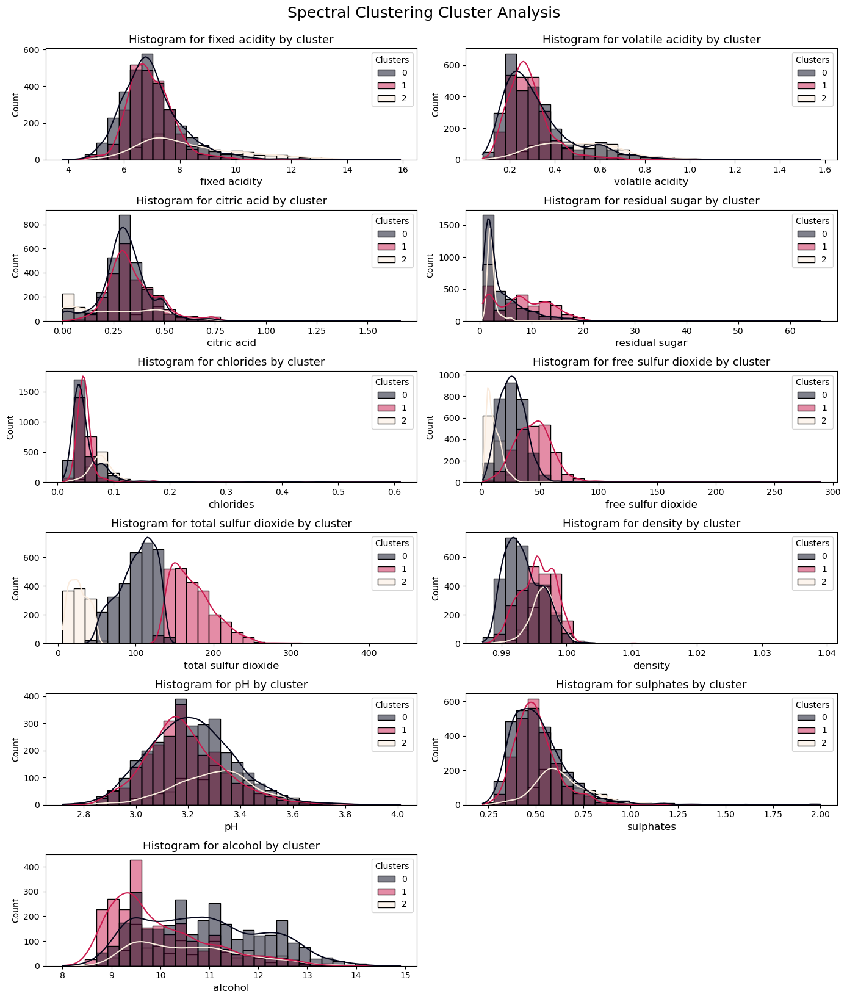

In [52]:
# Considering optimal number of clusters = 3
s_optimal = 3

# Spectral clustering model with the chosen number of clusters. Random state value given to ensure reproducibility. n_jobs -1 given for parellel processing
# Affinity as nearest_neighbours (Affinity matrix created based on nearest neighnors (n_neighbors=10 by default) in each data point)
final_cluster_model= SpectralClustering(n_clusters=s_optimal, affinity='nearest_neighbors', random_state=101, n_jobs=-1)

# Fitting the model and adding a new column to the dataset `Clusters` which contains the predicted cluster values
spectral_cluster_data['Clusters']=final_cluster_model.fit_predict(spectral_cluster_data)

# Setting the plot size
plt.figure(figsize=(14,16))

# for loop to iterate through the dataset columns (except the newly added Cluster column)
for i, col in enumerate(spectral_cluster_data.columns[:-1]):
    plt.subplot(6,2,i+1)
    
    # Plotting histograms of the indicator values, colored by the cluster value 
    sns.histplot(data=spectral_cluster_data, x=col, hue='Clusters', palette='rocket', kde=True, bins=30)
    
    # Adding title for individual plots, labels
    plt.title(f'Histogram for {col} by cluster', size=13)
    plt.xlabel(f"{col}",size=12)

# Making Layout compact, adding main title and displaying the histogram plot
plt.tight_layout()
plt.suptitle("Spectral Clustering Cluster Analysis", y=1.02, size=18)
plt.show()

*   **Observations**

    *   **K-means**:

        *   In the histograms of k-means cluster analysis, it was seen that indicators `total sulfur dioxide` ,`free sulfur dioxide` and `density` *(In decreasing order of seperation magnitude)* have the most seperations between each cluster in thier distributions

        *   Therefore, we selected `total sulfur dioxide` ,`free sulfur dioxide` and `density` as the most discriminatory variables
        
    *   **Spectral Clustering** :

        *   For Spectral Clustering cluster analysis, the same set of indicators (`total sulfur dioxide` ,`free sulfur dioxide` and `density`) have the highest seperations between each of thier clusters in thier distribution
        *   There is a higher number of clusters present in Spectral Clustering due to the higher optimal number of clusters for the model.
        *   Therefore, `total sulfur dioxide` ,`free sulfur dioxide` and `density` are selected as the both clustering methods give the same set of top discriminatory variables. 

*   Creating a series of scatter plots for the most discriminatory variables with other features present in the original spectral cluster data, colouring the points by cluster number.

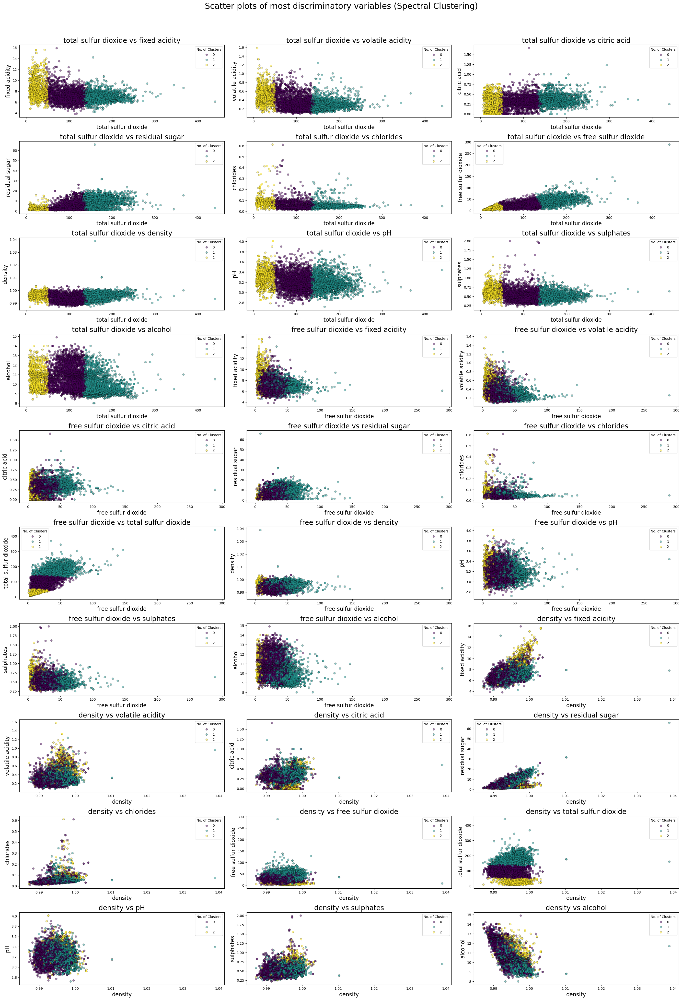

In [53]:
# Creating a list with most discriminatory variables
most_disc_vars=['total sulfur dioxide', 'free sulfur dioxide', 'density']

# Set to store already used variable combinations in plots
combinations=set()

# Set figure size
plt.figure(figsize=(28,40))

# Setting index value for subplotting
index=1

# for loop to iterate through pairs of most discriminatory variables and other variables in the original dataset (Clusters column excluded from the plot)
for i in range(len(most_disc_vars)):
    for j in range(len(spectral_cluster_data.columns[:-1])):

        # Ignore duplicate variable pairs and self-pairing 
        if most_disc_vars[i]!=spectral_cluster_data.columns[j] and (most_disc_vars[i],spectral_cluster_data.columns[j]) not in combinations:
            
            # Creating subplots
            plt.subplot(10,3,index)
            
            # Adding current variable pair to the set to avoid replotting
            combinations.add((most_disc_vars[i],spectral_cluster_data.columns[j]))
            
            # Creating scatterplot for the pair of variables, coloured and grouped by clusters
            sns.scatterplot(data=spectral_cluster_data, x=most_disc_vars[i], y=spectral_cluster_data.columns[j], hue='Clusters', 
                            palette='viridis', alpha=0.5, edgecolor='black')
            
            # Adding individual plot title, labels and legend
            plt.title(f"{most_disc_vars[i]} vs {spectral_cluster_data.columns[j]}",size=20)
            plt.xlabel(f"{most_disc_vars[i]}", size=16)
            plt.ylabel(f"{spectral_cluster_data.columns[j]}", size=16)
            plt.legend(title='No. of Clusters')

            # Increasing index value by 1
            index+=1

# Adding Main title, making plot compact and displaying the plot
plt.suptitle("Scatter plots of most discriminatory variables (Spectral Clustering)", size=24, y=1.02)
plt.tight_layout()
plt.show()

*   The scatterplots show the relationship between discriminatory variables and other features present in the dataset after Spectral Clustering

*   **Cluster scatterplots by `total sulfur dioxide`**

    *   The variables chosen as discriminatory, only `total sulfur dioxide` effectively seperate the data into 3 groups (clusters).

    *   The clusters are seperated well, with mid to high `total sulfur dioxide` values forming better well defined clusters than lower values.

    *   Slight overlap is observed at lower `total sulfur dioxide` values, denoting moderate distinction for lower values.

    *   Variables like `density`, `free sulfur dioxide` show distinct seperation, when combined with `total sulfur dioxide`, which suggests strong discriminatory power with these varible combinations

*   **Cluster scatterplots by `density`**

    *   The worst seperation trend appears in scatterplots with `density`, where the relationship with other variables appear weak.

    *   Unlike in K-means, the clusters are slightly more spread out, showing the spectral clusters ability to handle more complex relationships

    *   Seperation between clusters is not prominent with higher overlap between clusters in lower `density` values.

*   **Cluster scatterplots by `free sulfur dioxide`**

    *   `free sulfur dioxide` shows moderate cluster seperation with other variables when compared to `total sulfur dioxide` and `density`

    *   Clearer seperation between clusters can been seen, unlike in K-Means

    *   Clusters have moderate seperation with slight overlaps for higher values of `free sulfur dioxde. However, lower values have more pronounced overlap between clusters

 *   Therefore, most of the trends observed in K-means clustering method is largely consistent with those found in Spectral Clustering methods apart from the fact that we observe more spread in the clusters. This maybe due to the fact that spectral clustering method can handle more complex relation ship between variables.
